In [ ]:
pip install ipyplot 

In [4]:
#mengimport library yang digunakan
import pandas as pd                                     
import numpy as np                                     
import tensorflow as tf                                 
import os                                               
import shutil
import ipyplot                                              
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm as tq
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split    
from google_drive_downloader import GoogleDriveDownloader as gdd

Dataset link: https://drive.google.com/file/d/1WDIfsOxZULeD8Q3vyEogmA20DYWe6sR0/view?usp=sharing

In [5]:
#mendownload dataset
gdd.download_file_from_google_drive(file_id='1WDIfsOxZULeD8Q3vyEogmA20DYWe6sR0',
                                    dest_path='content/FreshStaleImages.zip',
                                    unzip=True)

Unzipping...Done.


In [6]:
base_dir = '/content/content/FreshStaleImages'
os.listdir(base_dir)

['fresh_tomato',
 'fresh_orange',
 'fresh_bitter_gourd',
 'stale_orange',
 'fresh_apple',
 'fresh_banana',
 'stale_capsicum',
 'stale_apple',
 'fresh_capsicum',
 'stale_bitter_gourd',
 'stale_banana',
 'stale_tomato']

In [7]:
#membuat list untuk nama file, label dan path gambar
file_name = []
label = []
file_path = []
for path, subdirs, files in os.walk(base_dir):
    for name in files:
        file_path.append(os.path.join(path, name)) 
        label.append(path.split('/')[-1])        
        file_name.append(name)

In [8]:
#mengubah data gambar berupa list file name, label dan path menjadi sebuah dataframe
Dataset = pd.DataFrame({"filepath":file_path,'filename':file_name,"label":label})
Dataset.groupby(['label']).size()

label
fresh_apple           1693
fresh_banana          1581
fresh_bitter_gourd     327
fresh_capsicum         990
fresh_orange          1466
fresh_tomato           981
stale_apple           2342
stale_banana          1467
stale_bitter_gourd     357
stale_capsicum         901
stale_orange          1595
stale_tomato           982
dtype: int64

In [9]:
Dataset.head()

,filepath,filename,label
0,/content/content/FreshStaleImages/fresh_tomato...,IMG_20200725_095424.jpg_0_3351.jpg,fresh_tomato
1,/content/content/FreshStaleImages/fresh_tomato...,tomato1_26.jpg_0_1587.jpg,fresh_tomato
2,/content/content/FreshStaleImages/fresh_tomato...,IMG_20200725_095418.jpg_0_3708.jpg,fresh_tomato
3,/content/content/FreshStaleImages/fresh_tomato...,DSCN4102.jpg_0_6472.jpg,fresh_tomato
4,/content/content/FreshStaleImages/fresh_tomato...,tomato1_45.jpg_0_3835.jpg,fresh_tomato


In [10]:
X= Dataset['filepath']
y= Dataset['label']

In [11]:
#split dataset awal menjadi data train dan test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=300)

In [16]:
df_train = pd.DataFrame({'filepath':X_train
              ,'label':y_train
             ,'set':'train'})

df_test = pd.DataFrame({'filepath':X_test
              ,'label':y_test
             ,'set':'test'})

In [17]:
print('Train size', len(df_train))
print('Test size', len(df_test))

Train size 11745
Test size 2937


In [18]:
#menampilkan jumlah gambar setiap label pada train dan test
print('===============TRAIN=============== \n')
print(df_train.groupby(['label']).size(),'\n')

print('===============TEST================ \n')
print(df_test.groupby(['label']).size(),'\n')

===============TRAIN=============== 

label
fresh_apple           1357
fresh_banana          1227
fresh_bitter_gourd     259
fresh_capsicum         799
fresh_orange          1191
fresh_tomato           797
stale_apple           1861
stale_banana          1149
stale_bitter_gourd     295
stale_capsicum         727
stale_orange          1293
stale_tomato           790
dtype: int64 

===============TEST================ 

label
fresh_apple           336
fresh_banana          354
fresh_bitter_gourd     68
fresh_capsicum        191
fresh_orange          275
fresh_tomato          184
stale_apple           481
stale_banana          318
stale_bitter_gourd     62
stale_capsicum        174
stale_orange          302
stale_tomato          192
dtype: int64 




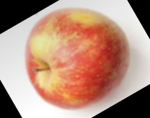
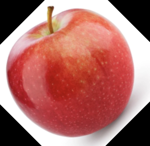
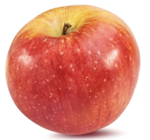
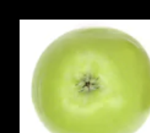
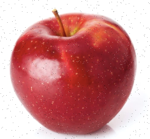
...
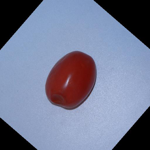
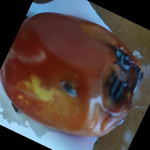
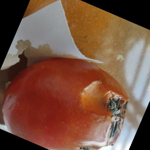
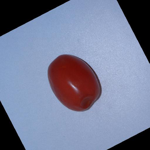
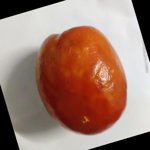

In [19]:
#menampilkan beberapa gambar di setiap label pada data train
labels = df_train['label'].values
images = df_train['filepath'].values
ipyplot.plot_class_tabs(images, labels, max_imgs_per_tab=15, img_width=150, force_b64=True)

In [20]:
#membuat direktori untuk train dan test
train_dir = base_dir + '/train'
test_dir = base_dir + '/test'
try:
    os.mkdir(train_dir)
    os.mkdir(test_dir)
except OSError:
    pass

In [21]:
#membuat direktori untuk setiap label pada direktori train dan test
label = Dataset['label'].drop_duplicates().values

for l in label:
  try:
    os.mkdir(train_dir + '/' + l)
    os.mkdir(test_dir + '/' + l)
  except OSError:
      pass

In [22]:
#memasukan file gambar untuk training ke setiap direktori label pada direktori train
for index, row in tq(df_train.iterrows()):
  #detect filepath
  filepath = row['filepath']
  if os.path.exists(filepath) == False:
    filepath = os.path.join(base_dir,row['label'], row['image'].split('.')[0])            
    
  #define file dest
  des_filename = filepath.split('/')[-1]
  dest_filepath = os.path.join(train_dir,row['label'],des_filename)
  
  #copy file from source to dest
  if os.path.exists(dest_filepath) == False:
    shutil.copy2(filepath,dest_filepath)

0it [00:00, ?it/s]

In [23]:
#memasukan file gambar untuk testing ke setiap direktori label pada direktori test
for index, row in tq(df_test.iterrows()):
  #detect filepath
  filepath = row['filepath']
  if os.path.exists(filepath) == False:
    filepath = os.path.join(base_dir,row['label'], row['image'].split('.')[0])            
    
  #define file dest
  des_filename = filepath.split('/')[-1]
  dest_filepath = os.path.join(test_dir,row['label'],des_filename)
  
  #copy file from source to dest
  if os.path.exists(dest_filepath) == False:
    shutil.copy2(filepath,dest_filepath)

0it [00:00, ?it/s]

In [24]:
train_datagen = ImageDataGenerator(
                    rescale=1./255,
                    rotation_range=20,
                    horizontal_flip=True,
                    shear_range = 0.2,
                    fill_mode = 'nearest')
 
test_datagen = ImageDataGenerator(
                    rescale=1./255,
                    rotation_range=20,
                    horizontal_flip=True,
                    shear_range = 0.2,
                    fill_mode = 'nearest')

In [25]:
train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(150, 150),
        batch_size=4,
        class_mode='categorical')
 
validation_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(150, 150),
        batch_size=4,
        class_mode='categorical')

num_class = validation_generator.num_classes

Found 11745 images belonging to 12 classes.
Found 2937 images belonging to 12 classes.


In [26]:
model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(150, 150, 3)),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(512, activation='relu'),
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.Dense(num_class, activation='softmax')
])

In [27]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 148, 148, 32)      896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 72, 72, 64)        18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 36, 36, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 34, 34, 128)       73856     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 17, 17, 128)       0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 15, 15, 128)       1

In [28]:
model.compile(loss='categorical_crossentropy',
              optimizer=tf.optimizers.Adam(),
              metrics=['accuracy'])

In [29]:
class myCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs={}):
    if(epoch > 50 and logs.get('accuracy') > 0.92 and logs.get('val_accuracy') > 0.92):
      print("\n Accuracy > 92% training dihentikan")
      self.model.stop_training = True

callbacks = myCallback()

In [30]:
history = model.fit(
    train_generator,
    steps_per_epoch=100,
    epochs=100,
    validation_data=validation_generator,
    validation_steps=5,
    verbose=2,
    callbacks=[callbacks])

Epoch 1/100
100/100 - 27s - loss: 2.3826 - accuracy: 0.1475 - val_loss: 2.1917 - val_accuracy: 0.2500
Epoch 2/100
100/100 - 26s - loss: 2.0225 - accuracy: 0.2950 - val_loss: 1.3302 - val_accuracy: 0.5000
Epoch 3/100
100/100 - 25s - loss: 1.7588 - accuracy: 0.3100 - val_loss: 1.4062 - val_accuracy: 0.4000
Epoch 4/100
100/100 - 24s - loss: 1.6047 - accuracy: 0.4225 - val_loss: 1.2023 - val_accuracy: 0.5000
Epoch 5/100
100/100 - 24s - loss: 1.4440 - accuracy: 0.4500 - val_loss: 2.0102 - val_accuracy: 0.4000
Epoch 6/100
100/100 - 24s - loss: 1.3315 - accuracy: 0.5100 - val_loss: 1.3117 - val_accuracy: 0.5000
Epoch 7/100
100/100 - 24s - loss: 1.2770 - accuracy: 0.5125 - val_loss: 1.2463 - val_accuracy: 0.5500
Epoch 8/100
100/100 - 24s - loss: 0.9999 - accuracy: 0.6350 - val_loss: 1.1206 - val_accuracy: 0.7000
Epoch 9/100
100/100 - 24s - loss: 1.0431 - accuracy: 0.5975 - val_loss: 0.5985 - val_accuracy: 0.8000
Epoch 10/100
100/100 - 25s - loss: 0.9498 - accuracy: 0.6375 - val_loss: 0.6381 - 

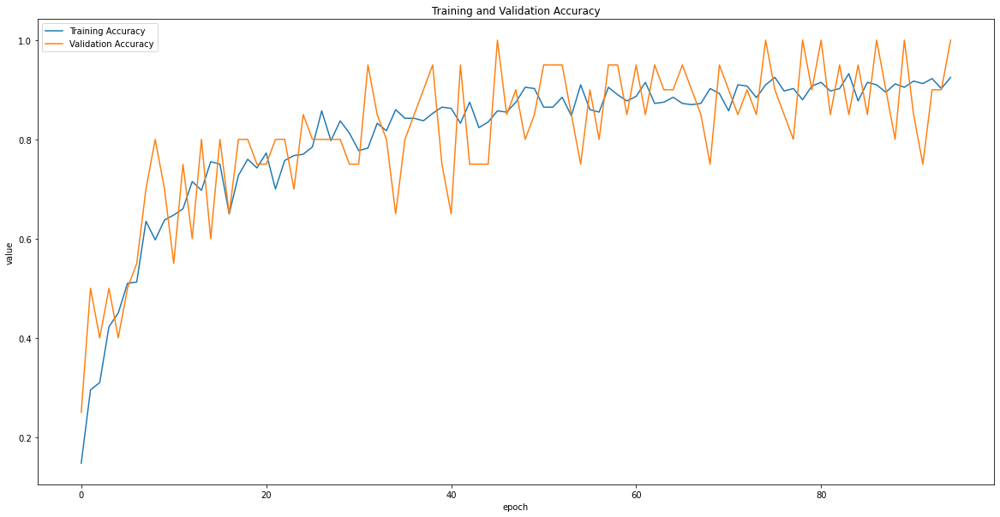

In [31]:
#summarize history for accuracy
fig, ax = plt.subplots(figsize=(20, 10))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Training and Validation Accuracy')
plt.ylabel('value')
plt.xlabel('epoch')
plt.legend(['Training Accuracy', 'Validation Accuracy'], loc='upper left')
plt.show()

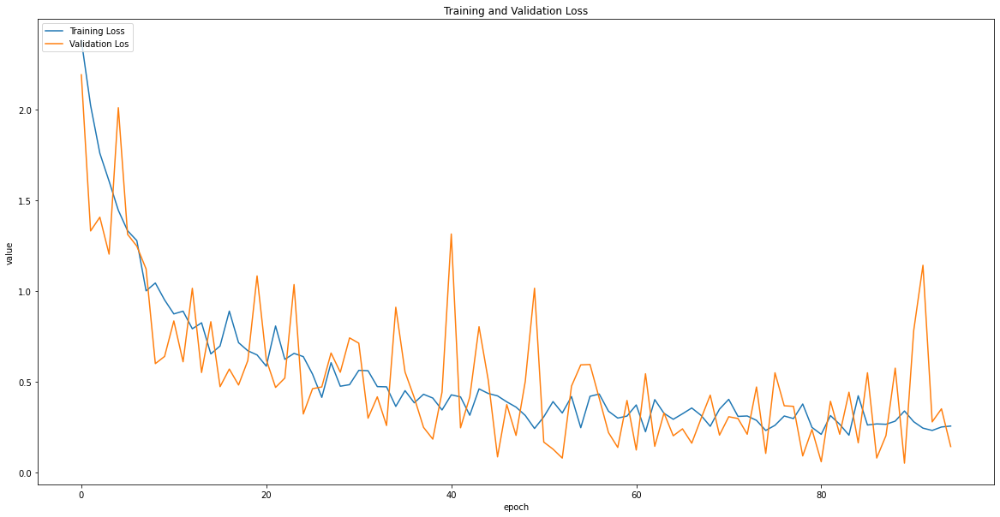

In [32]:
#summarize history for loss
fig, ax = plt.subplots(figsize=(20, 10))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Training and Validation Loss')
plt.ylabel('value')
plt.xlabel('epoch')
plt.legend(['Training Loss', 'Validation Los'], loc='upper left')
plt.show()

In [33]:
#konversi model
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

INFO:tensorflow:Assets written to: /tmp/tmpd0hvzpbs/assets


In [34]:
#menimpan model ke dalam format .tflite
with tf.io.gfile.GFile('model.tflite', 'wb') as f:
  f.write(tflite_model)